# Imports

In [1]:
import cv2
import torch
import numpy as np
from torch import nn
from tqdm import tqdm
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import random_split
from scipy.ndimage import binary_opening, binary_closing

# Dataset

In [2]:
dataset = torch.load("datasets/classification_dataset.pt")

class TupleDataset(Dataset):
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

N = len(dataset)

dataloader = DataLoader(
    TupleDataset(dataset),
    batch_size=5,
    shuffle=True,
    pin_memory=True
)

C:\Users\agile\AppData\Local\Temp\ipykernel_19164\4276731240.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  dataset = torch.load("datasets/classification_dataset.pt")


# Visualize Dataset

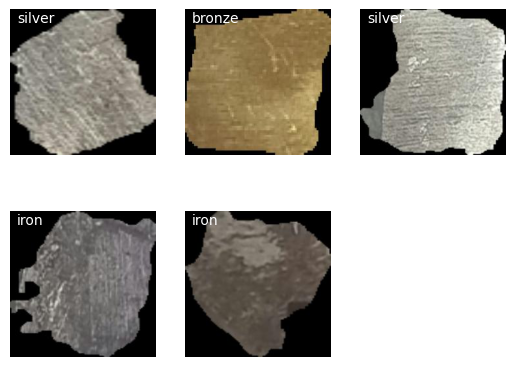

In [3]:
index_to_label = {
    0: "bronze",
    1: "copper",
    2: "iron",
    3: "silver",
    4: "disturb",
    5: "uncertain"
}

def visualize_dataset(images, labels):
    B = images.size(0)

    fig, axes = plt.subplots(B // 2, B - (B // 2))
    axes = axes.flatten()

    for ax in axes:
        ax.axis("off")
    
    for i in range(B):
        image = images[i].detach().cpu().numpy() # (3, H, W)
        label = labels[i].detach().cpu().numpy() # (H, W)

        if image.max() <= 1.0:
            image = (image * 255).astype(np.uint8)

        image = np.transpose(image, (1, 2, 0)) # (H, W, 3)
        class_index = np.argmax(label)
        label = index_to_label[class_index]
        
        axes[i].imshow(image)
        axes[i].text(10, 20, label, color="white")

    plt.show()
    
images, labels = next(iter(dataloader))
visualize_dataset(images, labels)

# Model

In [4]:
class AlexNet(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.features = nn.Sequential(
            # Conv1
            nn.Conv2d(3, 96, kernel_size=11, stride=4),
            nn.BatchNorm2d(96),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),

            # Conv2
            nn.Conv2d(96, 256, kernel_size=5, padding=2),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),

            # Conv3
            nn.Conv2d(256, 384, kernel_size=3, padding=1),
            nn.BatchNorm2d(384),
            nn.ReLU(inplace=True),

            # Conv4
            nn.Conv2d(384, 384, kernel_size=3, padding=1),
            nn.BatchNorm2d(384),
            nn.ReLU(inplace=True),

            # Conv5
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )

        # Ensures 6x6 regardless of input size (>= 224)
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),

            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),

            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x


# Training

In [5]:
device = 'cuda'
model = AlexNet(6)
model.to(device)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 96, kernel_size=(11, 11), stride=(4, 4))
    (1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(96, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): Conv2d(384, 256, kerne

In [6]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
criterion = nn.BCEWithLogitsLoss()

# training parameters
num_epochs = 100

Epoch 1/100: 100%|██████████| 90/90 [00:02<00:00, 30.73it/s]


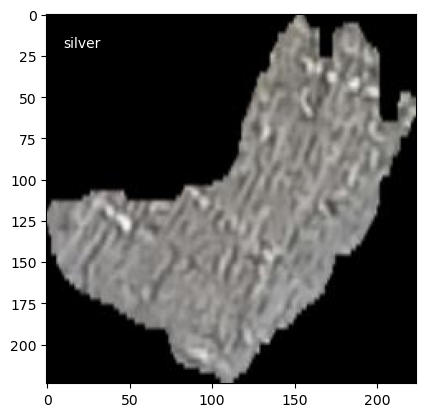

Epoch 1: Train Loss = 0.404180


Epoch 2/100: 100%|██████████| 90/90 [00:02<00:00, 33.17it/s]


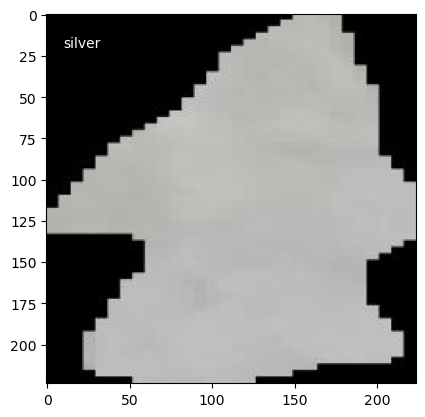

Epoch 2: Train Loss = 0.303870


Epoch 3/100: 100%|██████████| 90/90 [00:02<00:00, 33.06it/s]


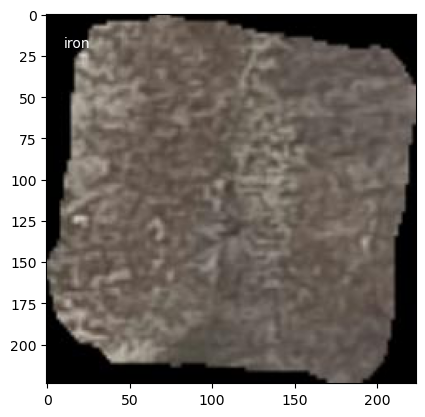

Epoch 3: Train Loss = 0.254200


Epoch 4/100: 100%|██████████| 90/90 [00:02<00:00, 33.25it/s]


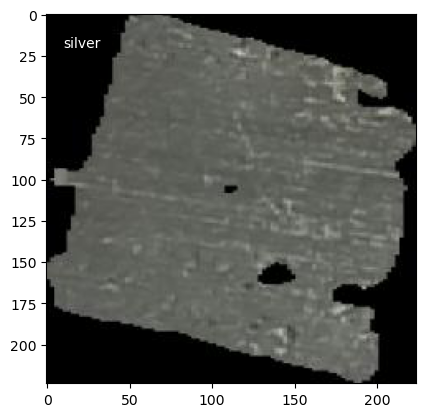

Epoch 4: Train Loss = 0.214810


Epoch 5/100: 100%|██████████| 90/90 [00:02<00:00, 33.36it/s]


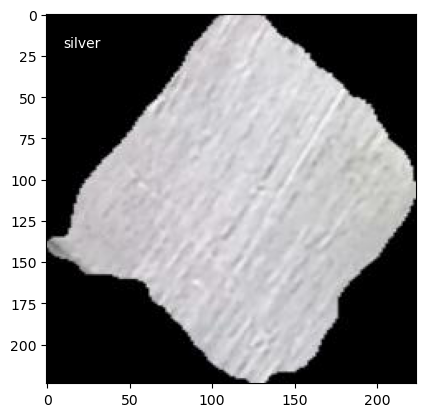

Epoch 5: Train Loss = 0.188272


Epoch 6/100: 100%|██████████| 90/90 [00:02<00:00, 33.24it/s]


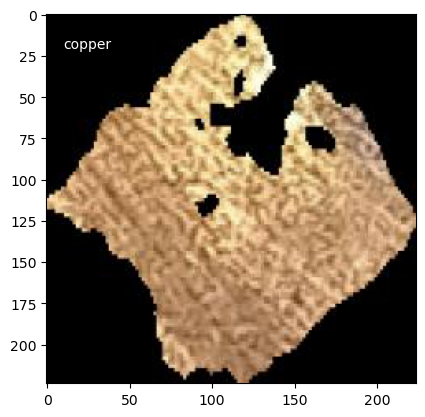

Epoch 6: Train Loss = 0.178207


Epoch 7/100: 100%|██████████| 90/90 [00:02<00:00, 33.04it/s]


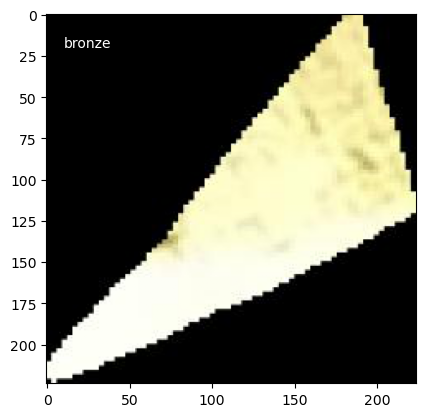

Epoch 7: Train Loss = 0.156327


Epoch 8/100: 100%|██████████| 90/90 [00:02<00:00, 33.08it/s]


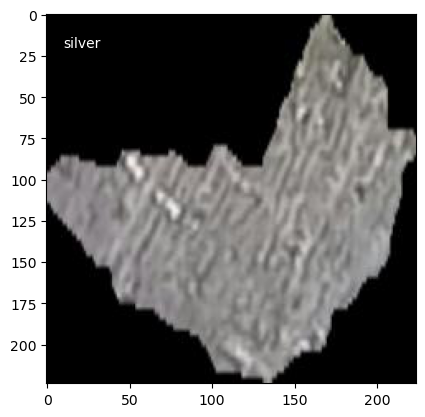

Epoch 8: Train Loss = 0.140655


Epoch 9/100: 100%|██████████| 90/90 [00:02<00:00, 33.35it/s]


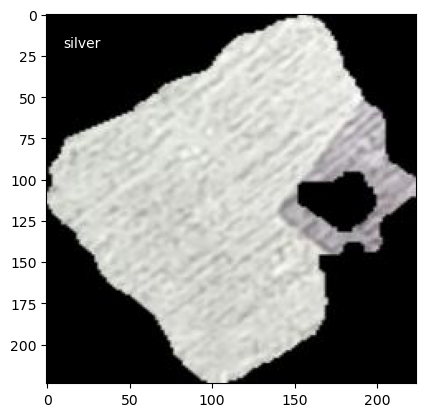

Epoch 9: Train Loss = 0.135959


Epoch 10/100: 100%|██████████| 90/90 [00:02<00:00, 33.26it/s]


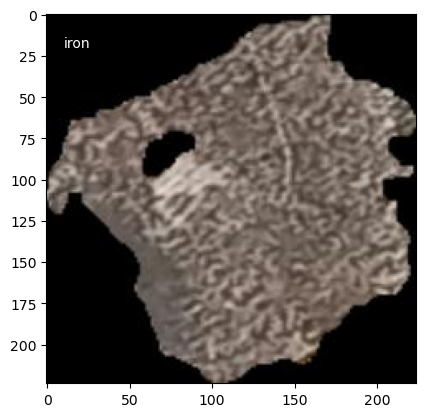

Epoch 10: Train Loss = 0.138532


Epoch 11/100: 100%|██████████| 90/90 [00:02<00:00, 32.37it/s]


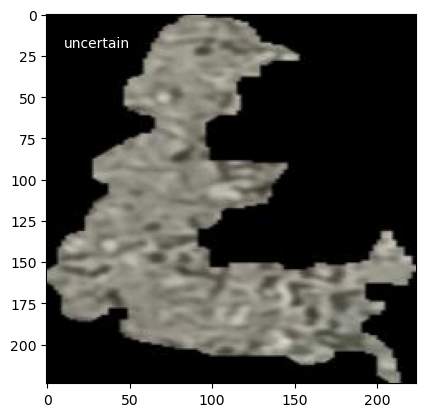

Epoch 11: Train Loss = 0.119102


Epoch 12/100: 100%|██████████| 90/90 [00:02<00:00, 31.76it/s]


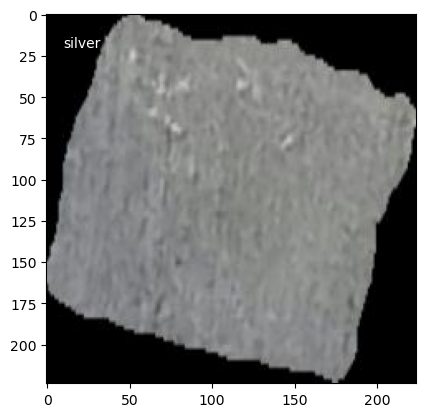

Epoch 12: Train Loss = 0.104911


Epoch 13/100: 100%|██████████| 90/90 [00:02<00:00, 32.11it/s]


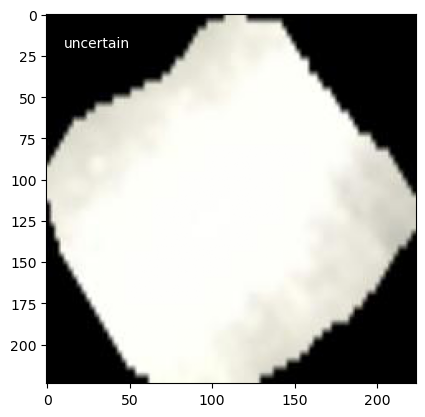

Epoch 13: Train Loss = 0.098080


Epoch 14/100: 100%|██████████| 90/90 [00:02<00:00, 32.02it/s]


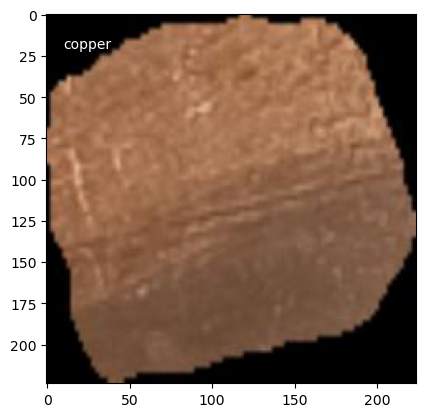

Epoch 14: Train Loss = 0.077427


Epoch 15/100: 100%|██████████| 90/90 [00:02<00:00, 31.83it/s]


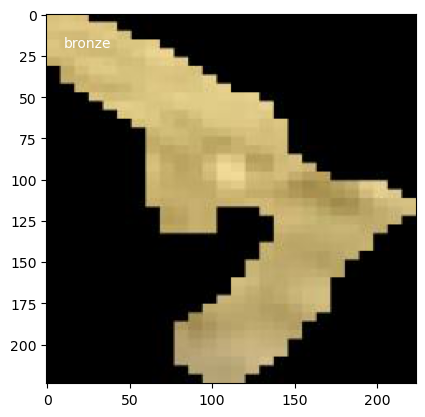

Epoch 15: Train Loss = 0.084610


Epoch 16/100: 100%|██████████| 90/90 [00:02<00:00, 31.93it/s]


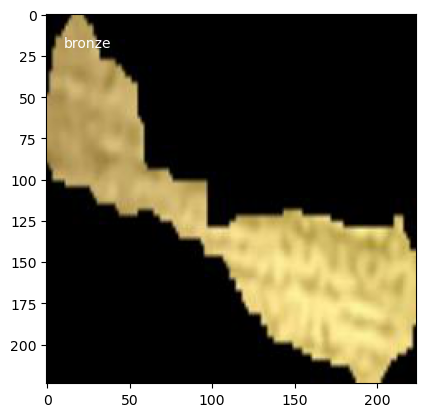

Epoch 16: Train Loss = 0.081853


Epoch 17/100: 100%|██████████| 90/90 [00:02<00:00, 31.98it/s]


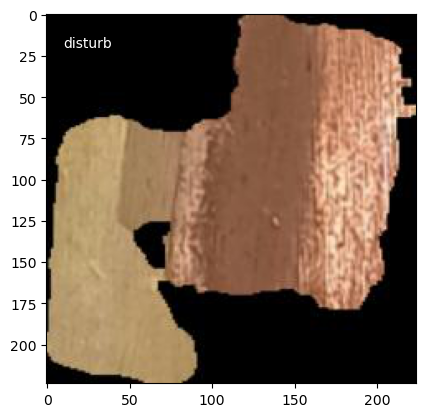

Epoch 17: Train Loss = 0.081406


Epoch 18/100: 100%|██████████| 90/90 [00:02<00:00, 32.09it/s]


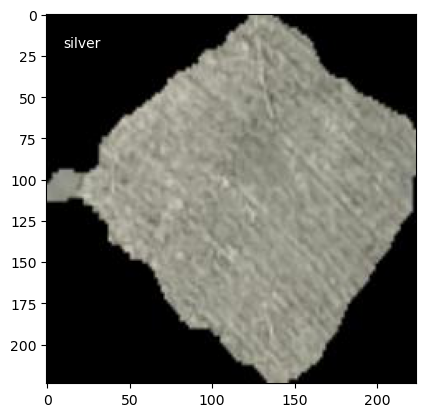

Epoch 18: Train Loss = 0.080537


Epoch 19/100: 100%|██████████| 90/90 [00:02<00:00, 32.04it/s]


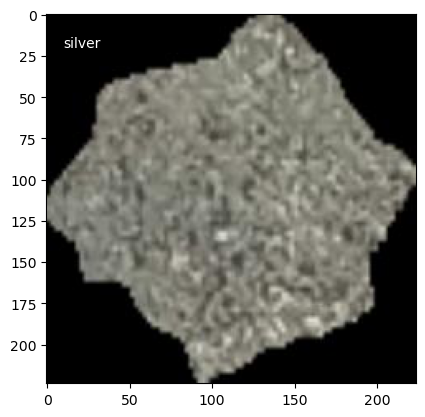

Epoch 19: Train Loss = 0.059912


Epoch 20/100: 100%|██████████| 90/90 [00:02<00:00, 31.85it/s]


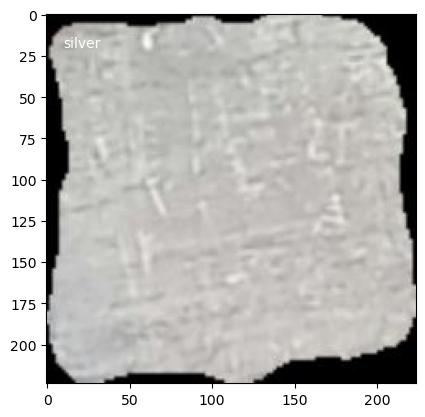

Epoch 20: Train Loss = 0.065484


Epoch 21/100: 100%|██████████| 90/90 [00:02<00:00, 32.03it/s]


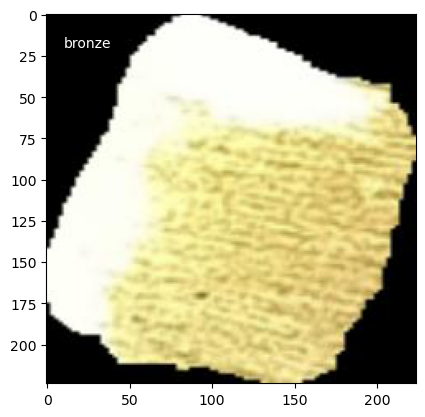

Epoch 21: Train Loss = 0.048745


Epoch 22/100: 100%|██████████| 90/90 [00:02<00:00, 31.78it/s]


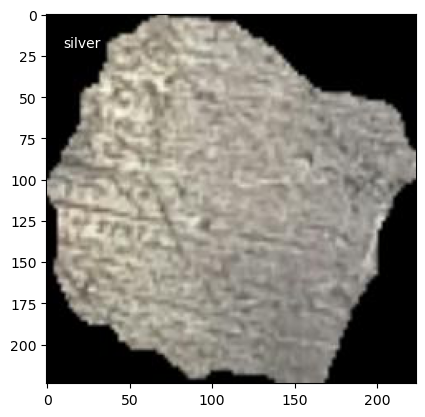

Epoch 22: Train Loss = 0.048304


Epoch 23/100: 100%|██████████| 90/90 [00:02<00:00, 33.23it/s]


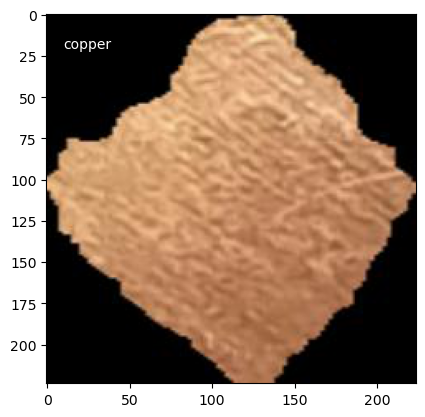

Epoch 23: Train Loss = 0.051642


Epoch 24/100: 100%|██████████| 90/90 [00:02<00:00, 33.24it/s]


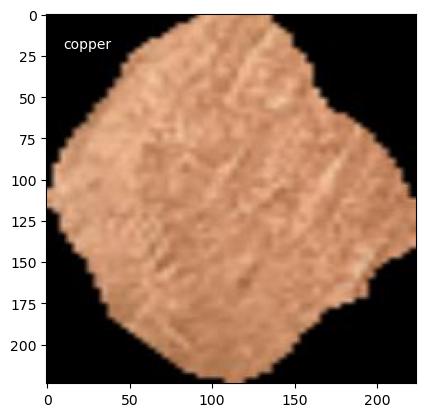

Epoch 24: Train Loss = 0.034560


Epoch 25/100: 100%|██████████| 90/90 [00:02<00:00, 33.24it/s]


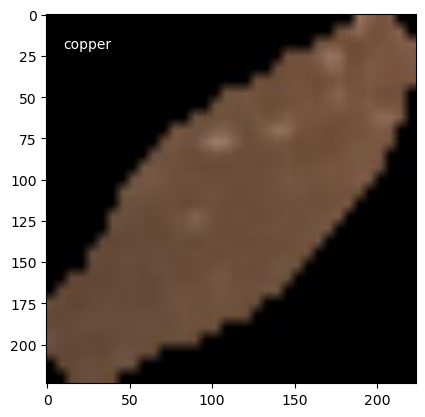

Epoch 25: Train Loss = 0.034378


Epoch 26/100: 100%|██████████| 90/90 [00:02<00:00, 33.19it/s]


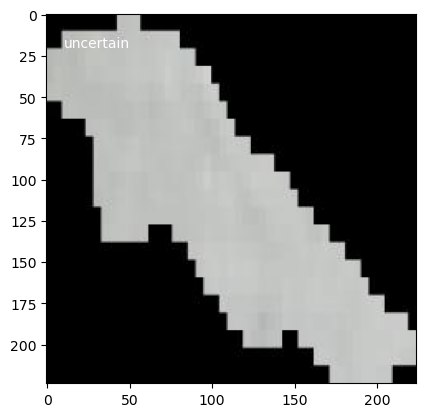

Epoch 26: Train Loss = 0.034515


Epoch 27/100: 100%|██████████| 90/90 [00:02<00:00, 33.33it/s]


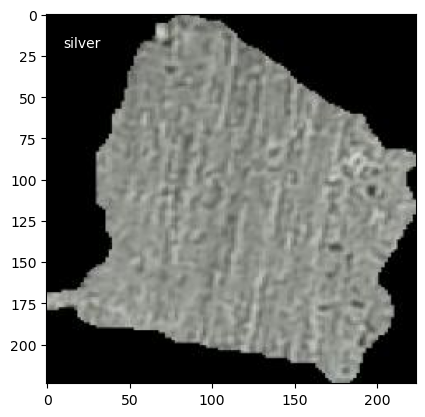

Epoch 27: Train Loss = 0.028631


Epoch 28/100: 100%|██████████| 90/90 [00:02<00:00, 33.10it/s]


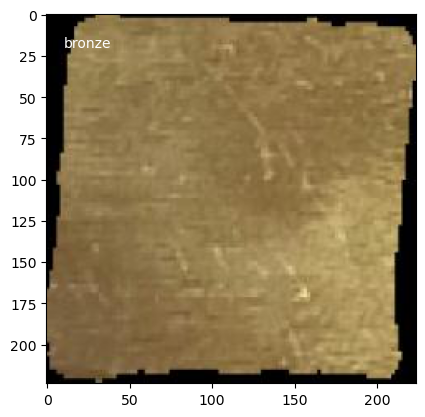

Epoch 28: Train Loss = 0.020415


Epoch 29/100: 100%|██████████| 90/90 [00:02<00:00, 33.19it/s]


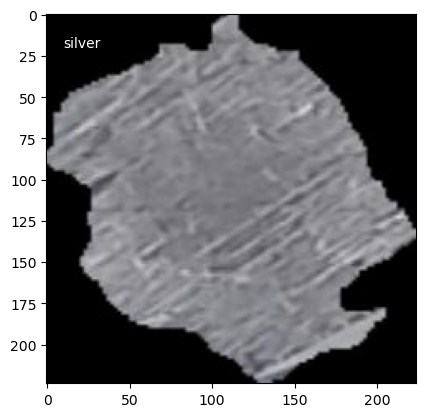

Epoch 29: Train Loss = 0.024663


Epoch 30/100: 100%|██████████| 90/90 [00:02<00:00, 33.10it/s]


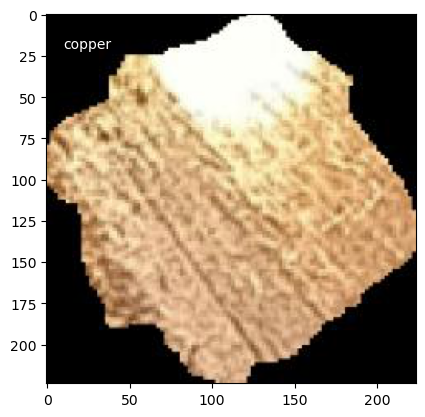

Epoch 30: Train Loss = 0.021923


Epoch 31/100: 100%|██████████| 90/90 [00:02<00:00, 32.92it/s]


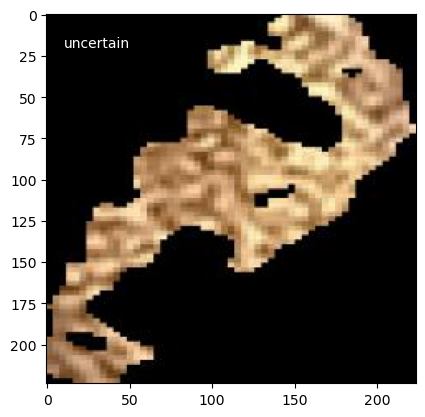

Epoch 31: Train Loss = 0.030148


Epoch 32/100: 100%|██████████| 90/90 [00:02<00:00, 33.14it/s]


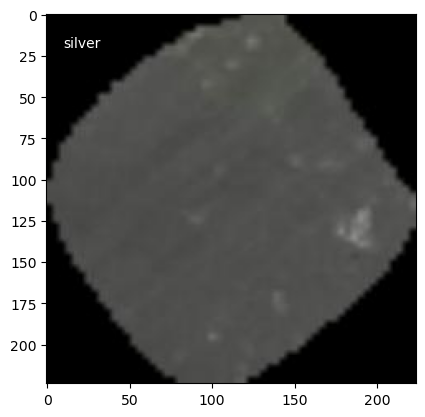

Epoch 32: Train Loss = 0.014732


Epoch 33/100: 100%|██████████| 90/90 [00:02<00:00, 33.43it/s]


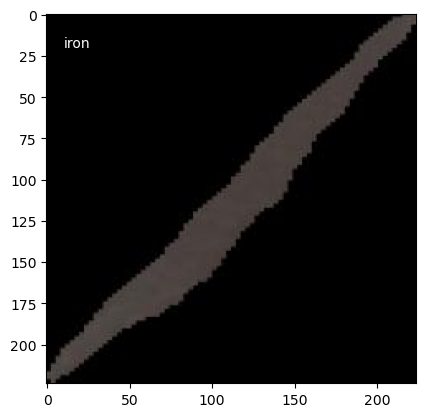

Epoch 33: Train Loss = 0.021111


Epoch 34/100: 100%|██████████| 90/90 [00:02<00:00, 33.27it/s]


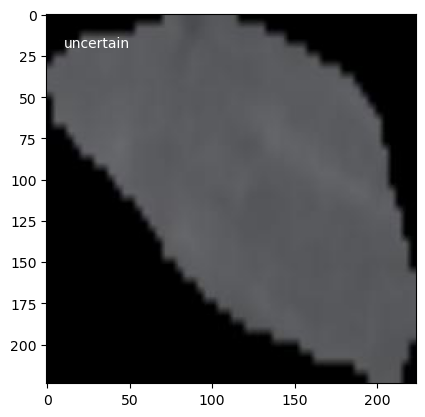

Epoch 34: Train Loss = 0.008959


Epoch 35/100: 100%|██████████| 90/90 [00:02<00:00, 33.43it/s]


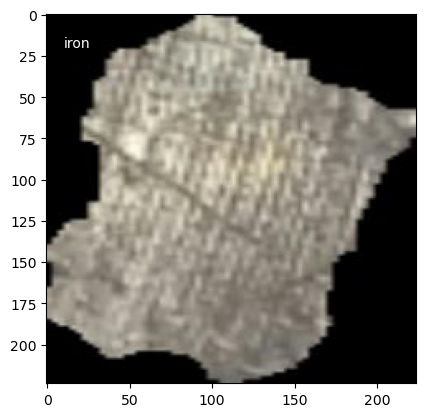

Epoch 35: Train Loss = 0.017120


Epoch 36/100: 100%|██████████| 90/90 [00:02<00:00, 33.34it/s]


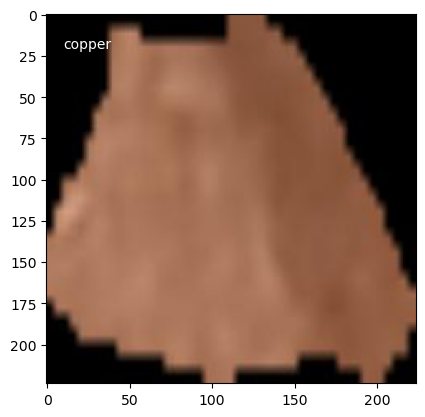

Epoch 36: Train Loss = 0.018482


Epoch 37/100: 100%|██████████| 90/90 [00:02<00:00, 33.23it/s]


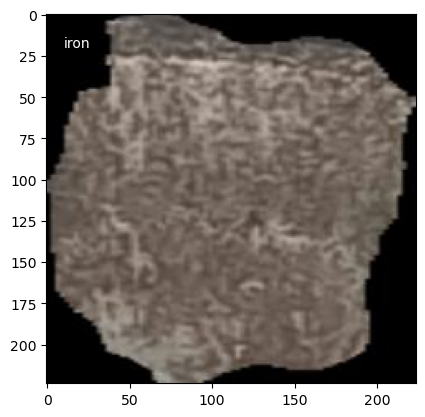

Epoch 37: Train Loss = 0.012266


Epoch 38/100: 100%|██████████| 90/90 [00:02<00:00, 33.23it/s]


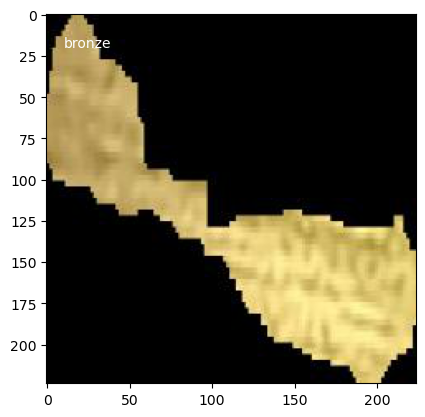

Epoch 38: Train Loss = 0.011331


Epoch 39/100: 100%|██████████| 90/90 [00:02<00:00, 33.33it/s]


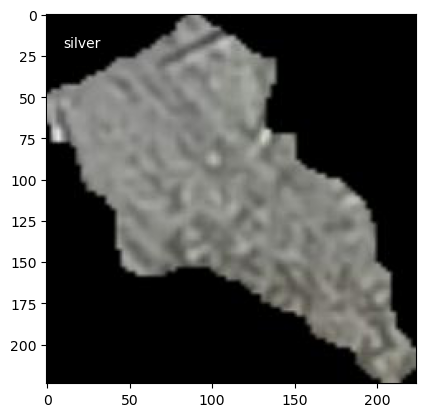

Epoch 39: Train Loss = 0.010635


Epoch 40/100: 100%|██████████| 90/90 [00:02<00:00, 33.20it/s]


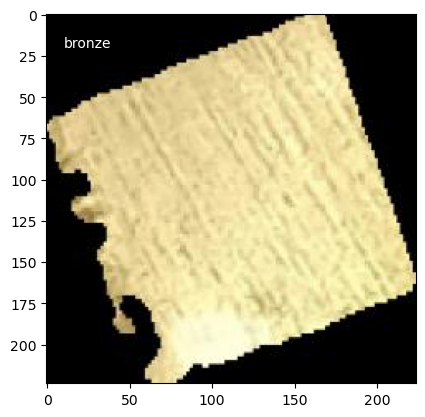

Epoch 40: Train Loss = 0.011506


Epoch 41/100: 100%|██████████| 90/90 [00:02<00:00, 33.32it/s]


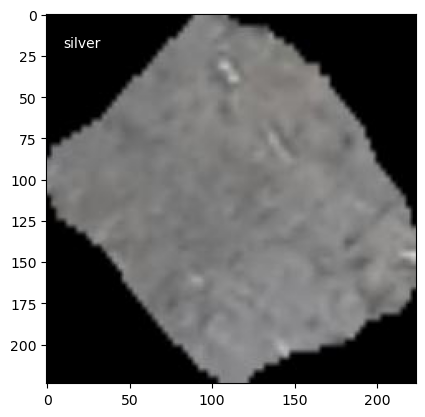

Epoch 41: Train Loss = 0.008420


Epoch 42/100: 100%|██████████| 90/90 [00:02<00:00, 33.63it/s]


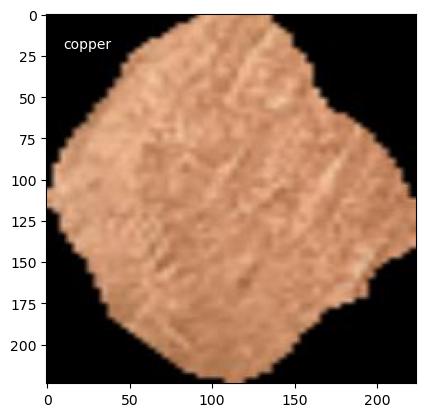

Epoch 42: Train Loss = 0.019168


Epoch 43/100: 100%|██████████| 90/90 [00:02<00:00, 33.31it/s]


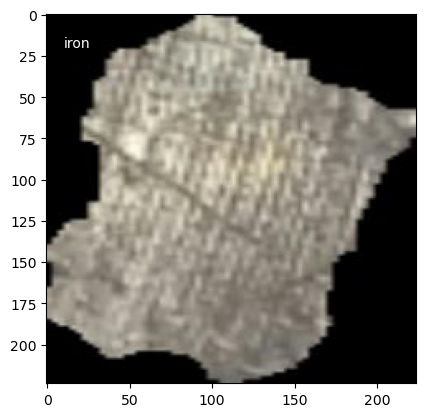

Epoch 43: Train Loss = 0.009561


Epoch 44/100: 100%|██████████| 90/90 [00:02<00:00, 33.32it/s]


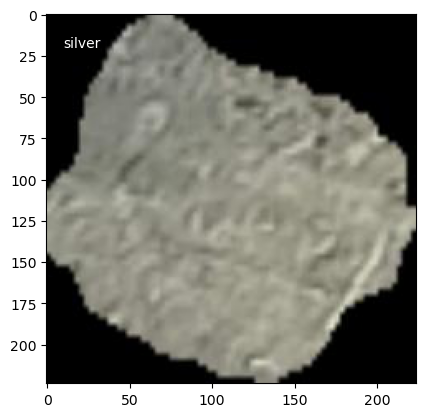

Epoch 44: Train Loss = 0.006768


Epoch 45/100: 100%|██████████| 90/90 [00:02<00:00, 33.23it/s]


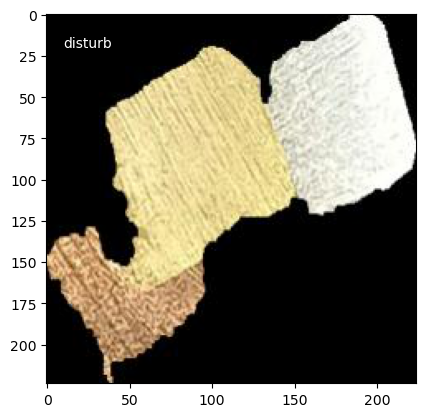

Epoch 45: Train Loss = 0.013652


Epoch 46/100: 100%|██████████| 90/90 [00:02<00:00, 33.19it/s]


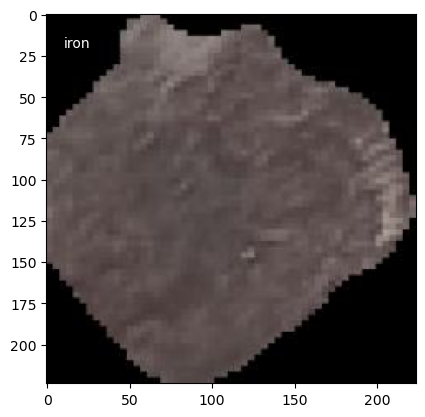

Epoch 46: Train Loss = 0.014904


Epoch 47/100: 100%|██████████| 90/90 [00:02<00:00, 33.32it/s]


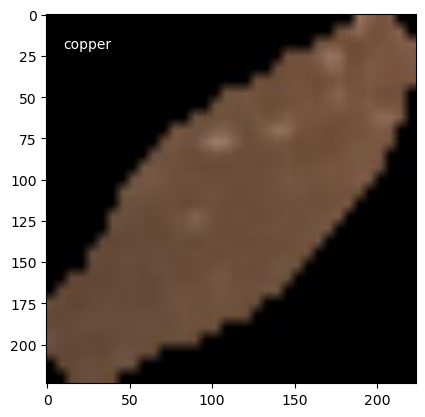

Epoch 47: Train Loss = 0.010729


Epoch 48/100: 100%|██████████| 90/90 [00:02<00:00, 33.27it/s]


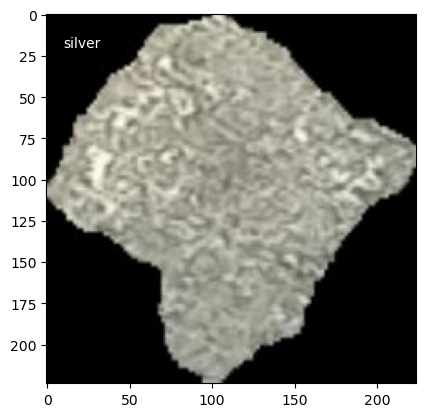

Epoch 48: Train Loss = 0.008652


Epoch 49/100: 100%|██████████| 90/90 [00:02<00:00, 33.24it/s]


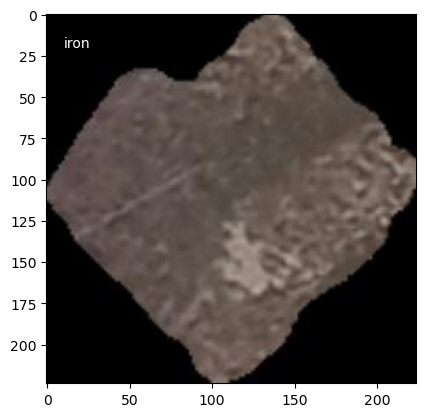

Epoch 49: Train Loss = 0.022347


Epoch 50/100: 100%|██████████| 90/90 [00:02<00:00, 33.26it/s]


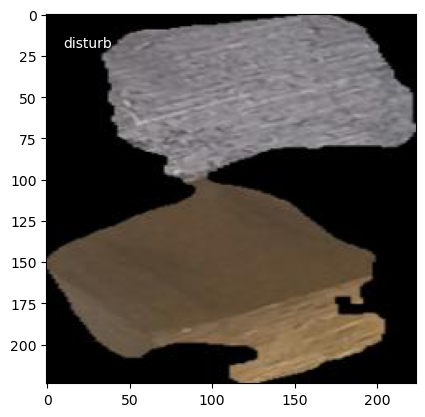

Epoch 50: Train Loss = 0.011157


Epoch 51/100: 100%|██████████| 90/90 [00:02<00:00, 33.25it/s]


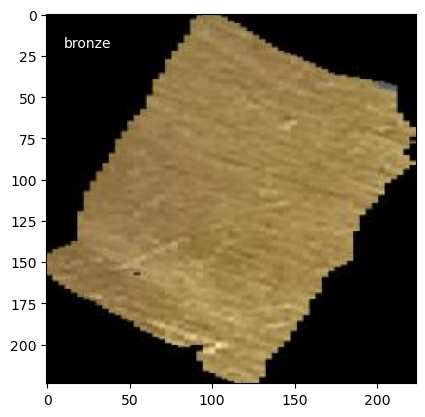

Epoch 51: Train Loss = 0.013960


Epoch 52/100: 100%|██████████| 90/90 [00:02<00:00, 33.26it/s]


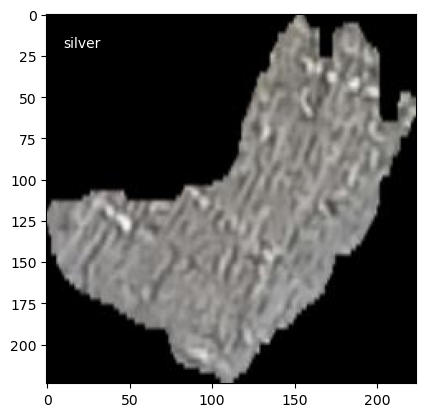

Epoch 52: Train Loss = 0.012004


Epoch 53/100: 100%|██████████| 90/90 [00:02<00:00, 33.24it/s]


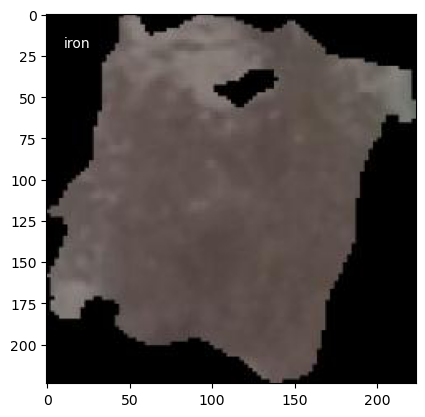

Epoch 53: Train Loss = 0.003769


Epoch 54/100: 100%|██████████| 90/90 [00:02<00:00, 33.34it/s]


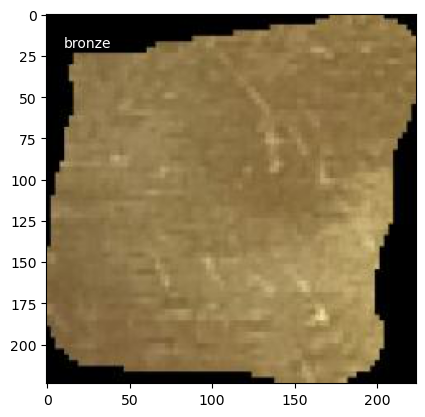

Epoch 54: Train Loss = 0.005238


Epoch 55/100: 100%|██████████| 90/90 [00:02<00:00, 33.37it/s]


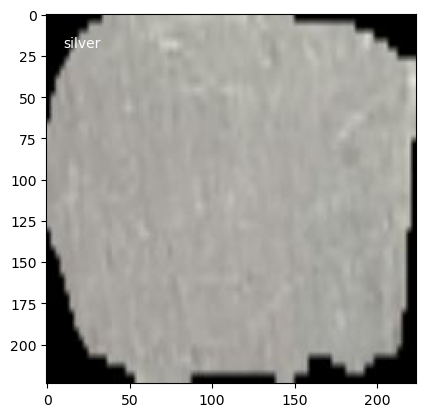

Epoch 55: Train Loss = 0.014348


Epoch 56/100: 100%|██████████| 90/90 [00:02<00:00, 32.49it/s]


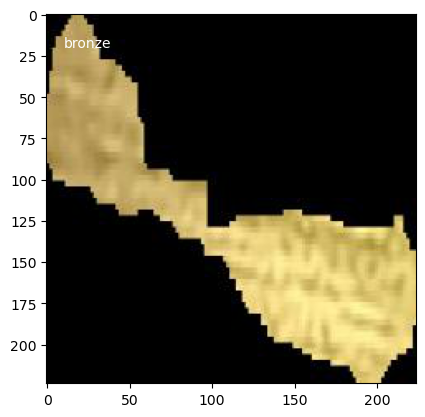

Epoch 56: Train Loss = 0.009251


Epoch 57/100: 100%|██████████| 90/90 [00:02<00:00, 31.30it/s]


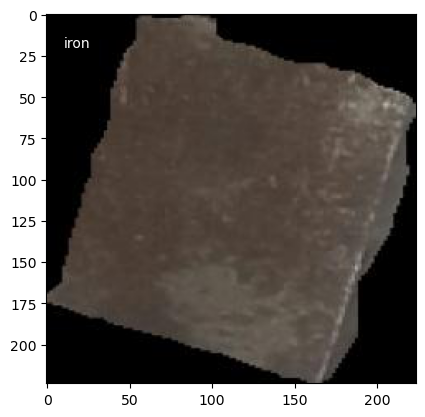

Epoch 57: Train Loss = 0.006484


Epoch 58/100: 100%|██████████| 90/90 [00:02<00:00, 32.37it/s]


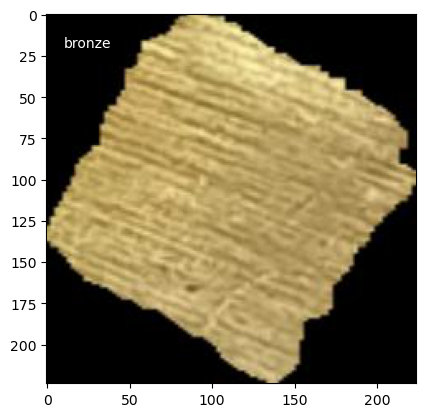

Epoch 58: Train Loss = 0.001840


Epoch 59/100: 100%|██████████| 90/90 [00:02<00:00, 32.61it/s]


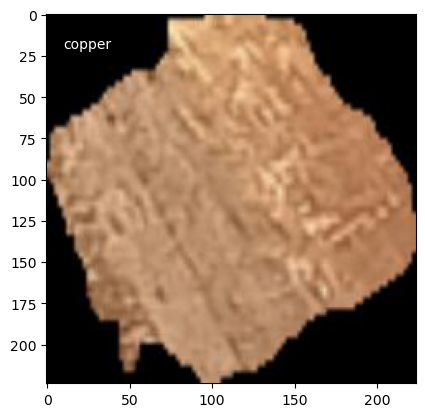

Epoch 59: Train Loss = 0.004003


Epoch 60/100: 100%|██████████| 90/90 [00:02<00:00, 33.22it/s]


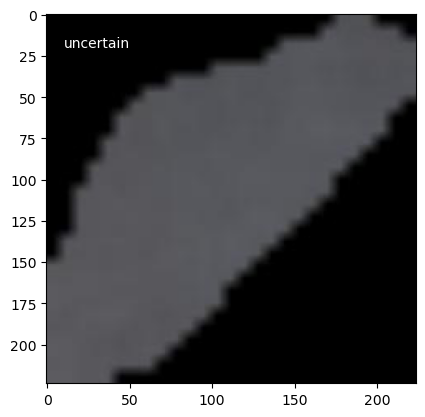

Epoch 60: Train Loss = 0.006251


Epoch 61/100: 100%|██████████| 90/90 [00:02<00:00, 32.64it/s]


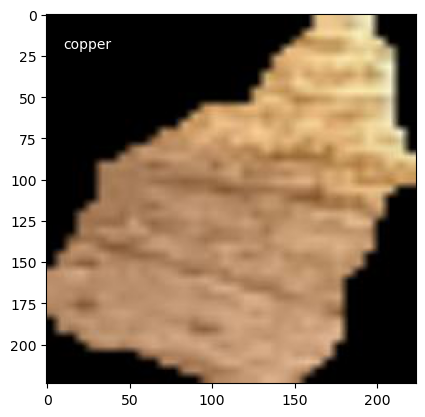

Epoch 61: Train Loss = 0.030980


Epoch 62/100: 100%|██████████| 90/90 [00:02<00:00, 32.52it/s]


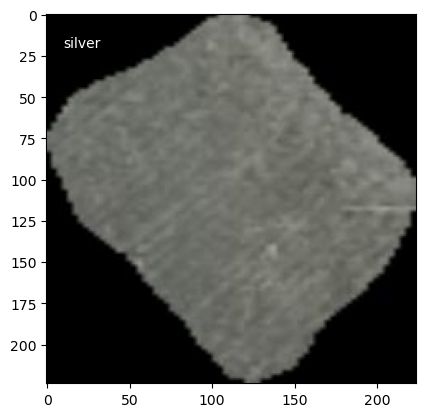

Epoch 62: Train Loss = 0.008757


Epoch 63/100: 100%|██████████| 90/90 [00:02<00:00, 33.12it/s]


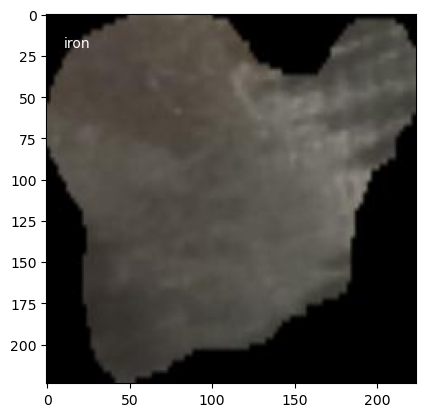

Epoch 63: Train Loss = 0.008345


Epoch 64/100: 100%|██████████| 90/90 [00:02<00:00, 33.32it/s]


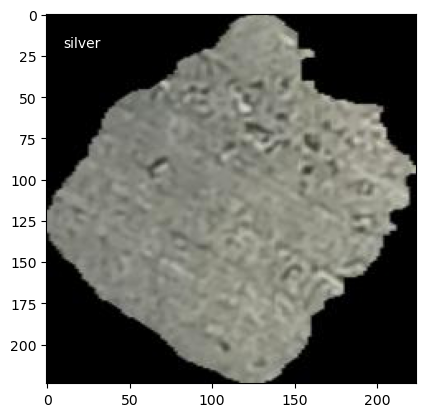

Epoch 64: Train Loss = 0.010320


Epoch 65/100: 100%|██████████| 90/90 [00:02<00:00, 33.36it/s]


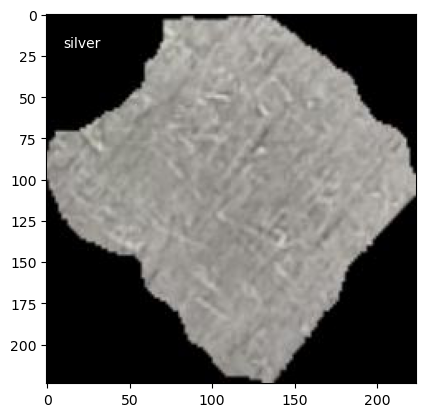

Epoch 65: Train Loss = 0.002528


Epoch 66/100: 100%|██████████| 90/90 [00:02<00:00, 33.33it/s]


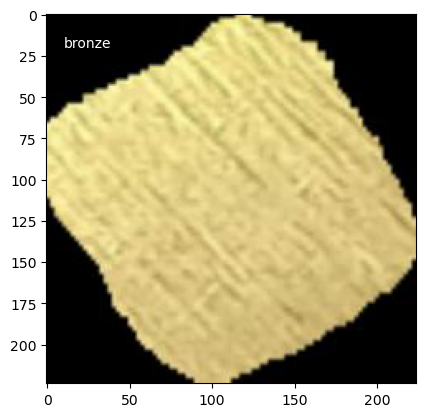

Epoch 66: Train Loss = 0.002027


Epoch 67/100: 100%|██████████| 90/90 [00:02<00:00, 33.05it/s]


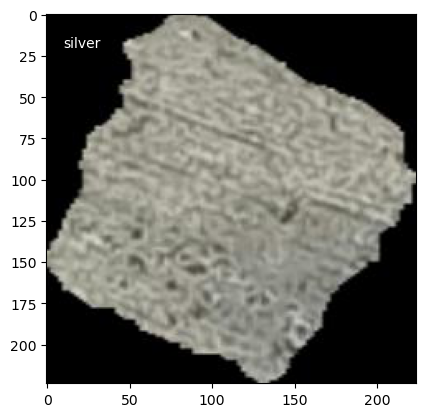

Epoch 67: Train Loss = 0.002896


Epoch 68/100: 100%|██████████| 90/90 [00:02<00:00, 33.20it/s]


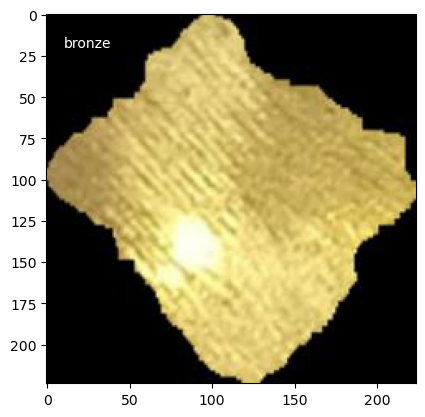

Epoch 68: Train Loss = 0.002105


Epoch 69/100: 100%|██████████| 90/90 [00:02<00:00, 33.03it/s]


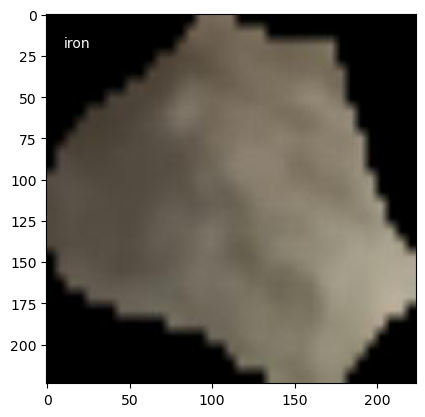

Epoch 69: Train Loss = 0.001651


Epoch 70/100: 100%|██████████| 90/90 [00:02<00:00, 31.65it/s]


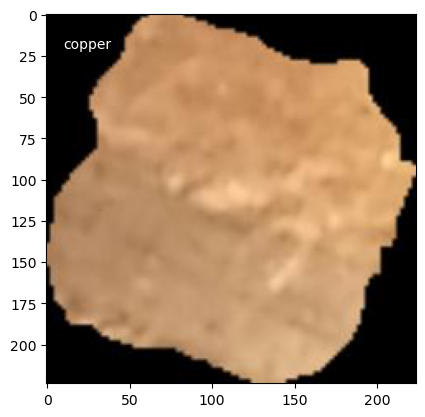

Epoch 70: Train Loss = 0.000538


Epoch 71/100: 100%|██████████| 90/90 [00:02<00:00, 31.58it/s]


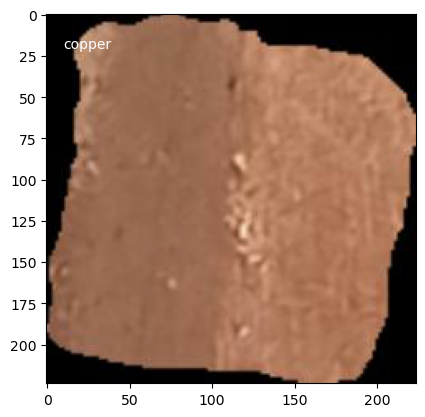

Epoch 71: Train Loss = 0.000728


Epoch 72/100: 100%|██████████| 90/90 [00:02<00:00, 32.49it/s]


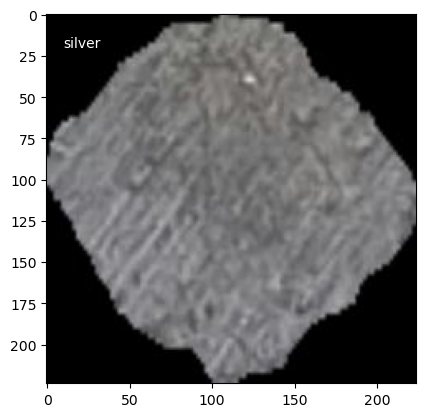

Epoch 72: Train Loss = 0.000774


Epoch 73/100: 100%|██████████| 90/90 [00:02<00:00, 32.98it/s]


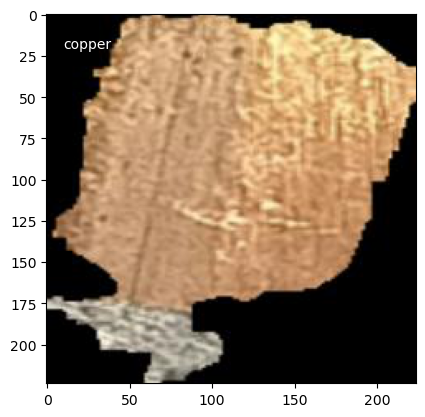

Epoch 73: Train Loss = 0.000394


Epoch 74/100: 100%|██████████| 90/90 [00:02<00:00, 33.27it/s]


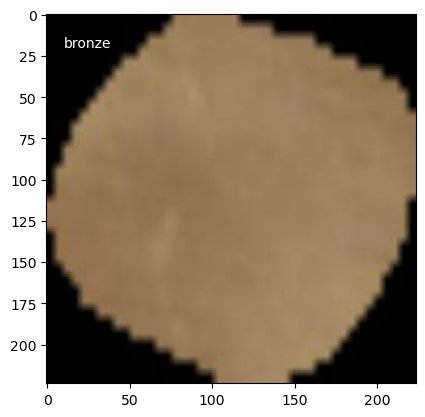

Epoch 74: Train Loss = 0.000343


Epoch 75/100: 100%|██████████| 90/90 [00:02<00:00, 33.08it/s]


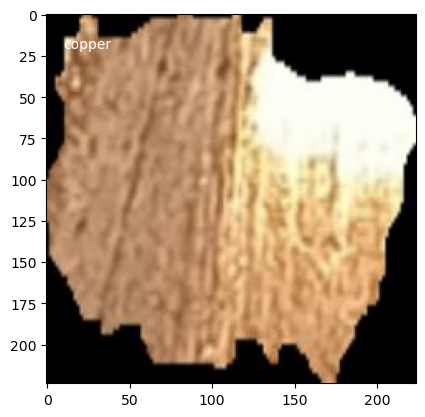

Epoch 75: Train Loss = 0.000817


Epoch 76/100: 100%|██████████| 90/90 [00:02<00:00, 33.01it/s]


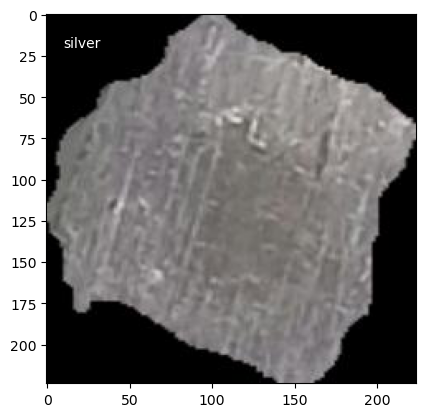

Epoch 76: Train Loss = 0.002917


Epoch 77/100: 100%|██████████| 90/90 [00:02<00:00, 32.81it/s]


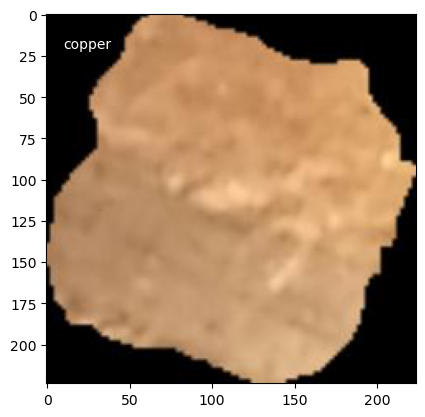

Epoch 77: Train Loss = 0.000470


Epoch 78/100: 100%|██████████| 90/90 [00:02<00:00, 33.22it/s]


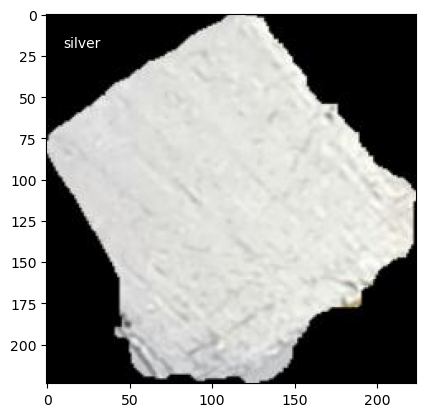

Epoch 78: Train Loss = 0.000362


Epoch 79/100: 100%|██████████| 90/90 [00:02<00:00, 33.23it/s]


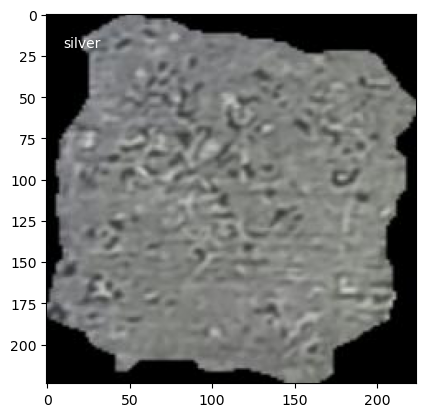

Epoch 79: Train Loss = 0.009722


Epoch 80/100: 100%|██████████| 90/90 [00:02<00:00, 33.01it/s]


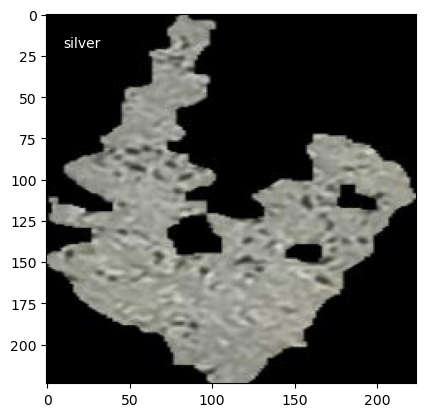

Epoch 80: Train Loss = 0.020029


Epoch 81/100: 100%|██████████| 90/90 [00:02<00:00, 33.11it/s]


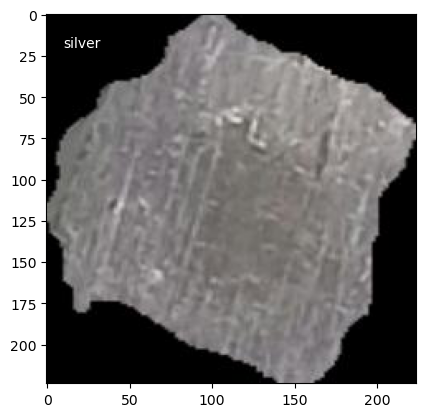

Epoch 81: Train Loss = 0.005814


Epoch 82/100: 100%|██████████| 90/90 [00:02<00:00, 33.03it/s]


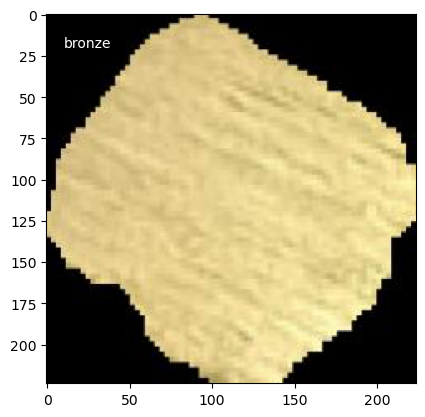

Epoch 82: Train Loss = 0.003190


Epoch 83/100: 100%|██████████| 90/90 [00:02<00:00, 33.22it/s]


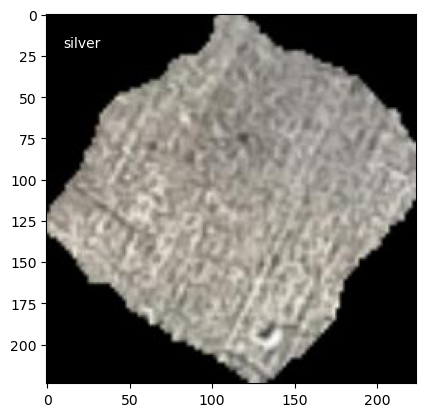

Epoch 83: Train Loss = 0.011582


Epoch 84/100: 100%|██████████| 90/90 [00:02<00:00, 32.80it/s]


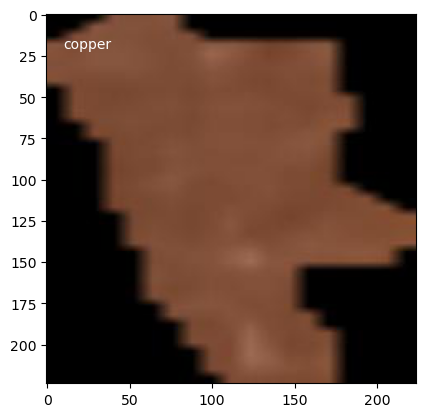

Epoch 84: Train Loss = 0.006301


Epoch 85/100: 100%|██████████| 90/90 [00:02<00:00, 33.06it/s]


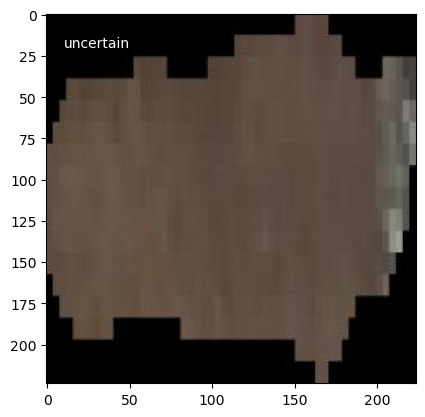

Epoch 85: Train Loss = 0.008570


Epoch 86/100: 100%|██████████| 90/90 [00:02<00:00, 33.00it/s]


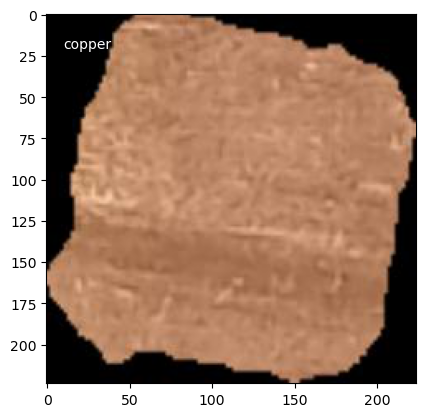

Epoch 86: Train Loss = 0.008054


Epoch 87/100: 100%|██████████| 90/90 [00:02<00:00, 33.12it/s]


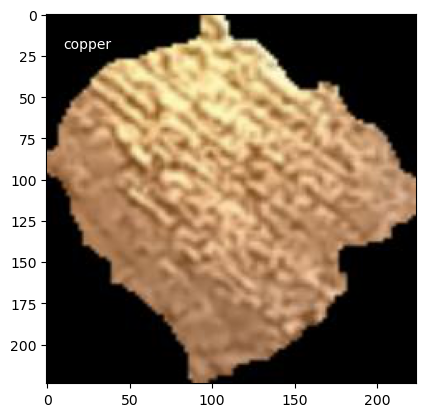

Epoch 87: Train Loss = 0.013670


Epoch 88/100: 100%|██████████| 90/90 [00:02<00:00, 33.40it/s]


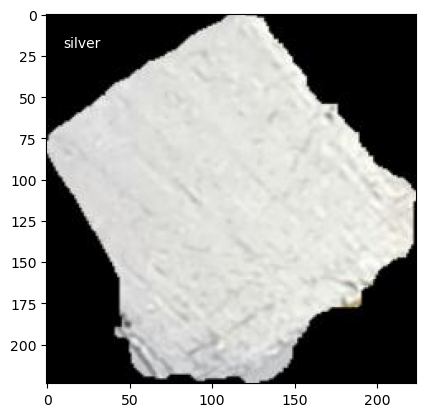

Epoch 88: Train Loss = 0.022408


Epoch 89/100: 100%|██████████| 90/90 [00:02<00:00, 33.30it/s]


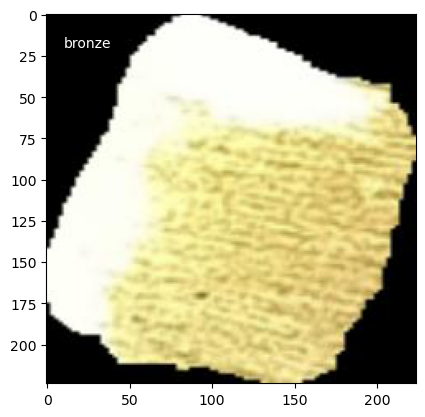

Epoch 89: Train Loss = 0.004801


Epoch 90/100: 100%|██████████| 90/90 [00:02<00:00, 32.87it/s]


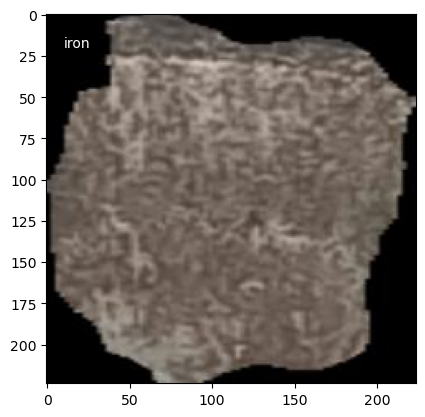

Epoch 90: Train Loss = 0.003137


Epoch 91/100: 100%|██████████| 90/90 [00:02<00:00, 33.07it/s]


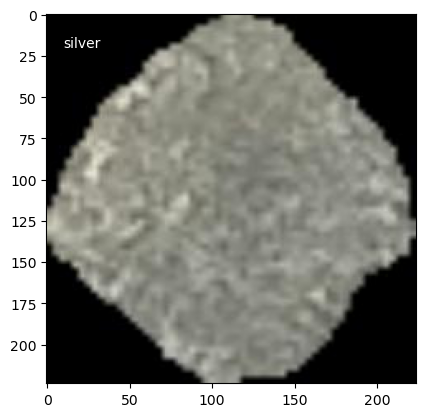

Epoch 91: Train Loss = 0.006842


Epoch 92/100: 100%|██████████| 90/90 [00:02<00:00, 33.25it/s]


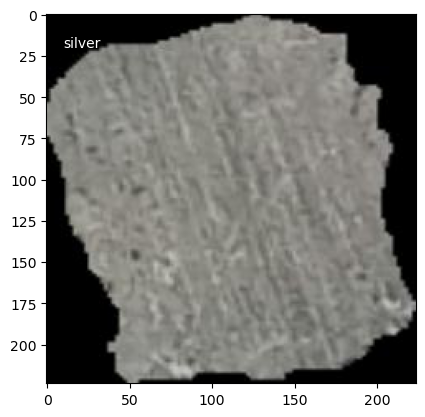

Epoch 92: Train Loss = 0.006004


Epoch 93/100: 100%|██████████| 90/90 [00:02<00:00, 33.23it/s]


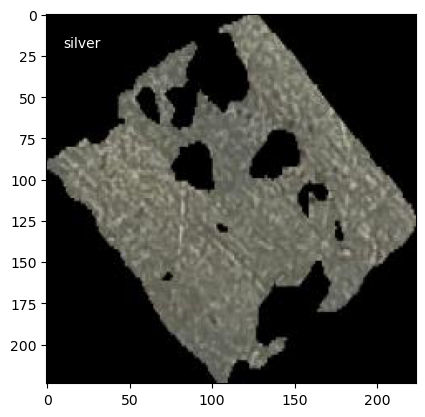

Epoch 93: Train Loss = 0.026085


Epoch 94/100: 100%|██████████| 90/90 [00:02<00:00, 33.01it/s]


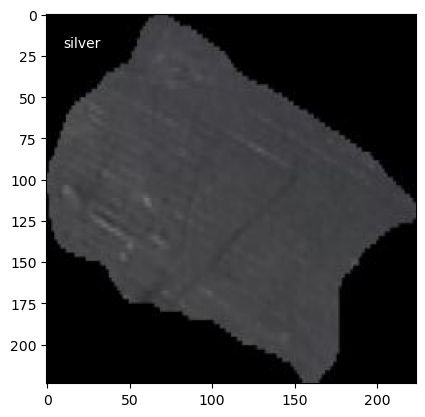

Epoch 94: Train Loss = 0.024120


Epoch 95/100: 100%|██████████| 90/90 [00:02<00:00, 33.02it/s]


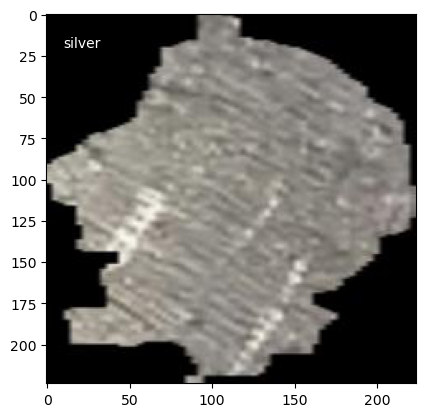

Epoch 95: Train Loss = 0.003504


Epoch 96/100:  90%|█████████ | 81/90 [00:02<00:00, 32.85it/s]


KeyboardInterrupt: 

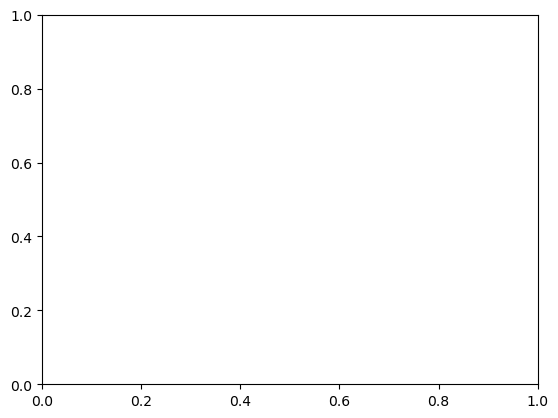

In [7]:
scaler = torch.amp.GradScaler(device) # <-- mixed precision scaler

for epoch in range(num_epochs):
    model.train()
    train_loss = 0
    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")
    fig, axes = plt.subplots(1, 1)

    # training
    for inputs, targets in pbar:
        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()

        with torch.amp.autocast(device): # <-- autocast back in
            outputs = model(inputs) # full forward in FP16/FP32 mix
            loss = criterion(outputs, targets)

        scaler.scale(loss).backward() # <-- scaled backprop
        scaler.step(optimizer)
        scaler.update()

        train_loss += loss.item()

    model.eval()
    with torch.no_grad():
        for inputs, targets in dataloader: # fresh iterator
            inputs = inputs.to(device)

            with torch.amp.autocast(device): # safe inference AMP
                out = model(inputs[:1])

            out = out[0]
            idx = torch.argmax(out)
            
            image = inputs[0].detach().cpu()
            image = torch.permute(image, (1, 2, 0))

            im = axes.imshow(image, cmap='hot')
            axes.text(10, 20, index_to_label[idx.item()], color="white")
            plt.show()
            break

    print(f"Epoch {epoch+1}: Train Loss = {train_loss / len(dataloader):.6f}")

In [8]:
torch.save(model.state_dict(), "models/classification_model.pth")

In [9]:
def precision_recall(model, dataloader, device, num_classes):
    model.eval()

    TP = torch.zeros(num_classes)
    FP = torch.zeros(num_classes)
    FN = torch.zeros(num_classes)

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = model(inputs)

            preds = torch.argmax(outputs, dim=1)
            true  = torch.argmax(targets, dim=1)

            for c in range(num_classes):
                TP[c] += ((preds == c) & (true == c)).sum().item()
                FP[c] += ((preds == c) & (true != c)).sum().item()
                FN[c] += ((preds != c) & (true == c)).sum().item()

    precision = TP / (TP + FP + 1e-8)
    recall    = TP / (TP + FN + 1e-8)

    return precision, recall


In [10]:
precision, recall = precision_recall(model, dataloader, device, 6)
print(f"Precision: {precision}, Recall: {recall}")

Precision: tensor([1., 1., 1., 1., 1., 1.]), Recall: tensor([1., 1., 1., 1., 1., 1.])
